# Function to load the trajectories of a file and fill the correlations 00, 01 and 11 in a rolling manner to avoid mem overflow: N runs, 2 particles indexed 0 and 1.

In [1]:
import seaborn as sns

custom_params = {
    "xtick.direction": "in",
    "ytick.direction": "in",
    "lines.markeredgecolor": "k",
    "lines.markeredgewidth": 1.25,
    "figure.dpi": 200,
    "text.usetex": True,
    "font.family": "serif"}
sns.set_theme(context = "poster", style="ticks", rc=custom_params) 

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats
import matplotlib.pyplot as plt
from scipy.signal import correlate

def zero_mean(arr):
    return arr - np.mean(arr)

def plot_trajectories(df: pd.DataFrame, timestep_duration = 5e-2, run_id=0):
    """
    Plot x, y, z trajectories for the two particles for a single specified run (default run 0).
    Add vertical lines when Particle 0 and Particle 1 cross in x.
    """

    run_df = df[df['run'] == run_id]

    coords = {
        axis: run_df.pivot(index='timestep', columns='particle_id', values=axis)
        for axis in ['x', 'y', 'z', 'x_original']
    }

    timesteps = coords['x'].index * timestep_duration

    x0 = coords['x_original'][0].values
    x1 = coords['x_original'][1].values
    diff = x0 - x1
    crossings = np.where(np.diff(np.sign(diff)) != 0)[0]
    crossing_times = timesteps[crossings]

    fig, axs = plt.subplots(1, 4, figsize=(18, 4))
    for i, axis in enumerate(['x_original', 'x', 'y', 'z']):
        ax = axs[i]
        ax.plot(timesteps, coords[axis][0], label='Particle 0')
        ax.plot(timesteps, coords[axis][1], label='Particle 1')
        ax.set_xlabel('time (s)')
        ax.set_ylabel(f'{axis.upper()} ($\\mu m$)')
        ax.grid(True)
        ax.legend()


        for t in crossing_times:
            ax.axvline(t, color='gray', linestyle='--', linewidth=0.8)

    plt.tight_layout()
    plt.show()




def correction_shear(df, shear_rate, timestep_duration, original_x_col='x_original'):
    """
    Incrementally remove linear shear flow in x due to shear_rate * z * dt.
    Overwrite df['x'] with corrected values each time, referencing an 'x_original' column to avoid double correction.
    I did use chatgpt for this one. Sorry

    """

    df = df.copy()

    if original_x_col not in df.columns:
        df[original_x_col] = df['x']

    df['dx_shear'] = shear_rate * df['z'] * timestep_duration
    df['dx'] = df.groupby(['run', 'particle_id'])[original_x_col].diff().fillna(0)

    df['dx_corrected'] = df['dx'] - df['dx_shear']
    df['x'] = df.groupby(['run', 'particle_id'])['dx_corrected'].cumsum()


    initial_x = df.groupby(['run', 'particle_id'])[original_x_col].transform('first')
    df['x'] += initial_x

    df.drop(columns=['dx_shear', 'dx', 'dx_corrected'], inplace=True)

    return df




def normalize_correlation(c, a, b):
    """
    Normalize correlation result by standard deviations of inputs.
    """
    return c / (np.std(a) * np.std(b) * len(a))



def compute_lagged_correlations(df: pd.DataFrame, normalize: bool = True) -> dict:
    """
    Compute lagged per-coordinate autocorrelation and cross-correlation using scipy.signal.correlate.
    Returns dictionary of averaged correlations across runs, centered at zero lag.
    """
    results = {key: [] for key in ['x00', 'x11', 'x01', 'y00', 'y11', 'y01', 'z00', 'z11', 'z01']}
    grouped = df.groupby('run')

    for _, run_df in grouped:
        coords = {
            axis: run_df.pivot(index='timestep', columns='particle_id', values=axis)
            for axis in ['x', 'y', 'z']
        }

        for axis in ['x', 'y', 'z']:
            # Extract the data for each coordinate for particles 0 and 1
            a = coords[axis]

            s00 = correlate(zero_mean(a[0]), zero_mean(a[0]), mode='full')
            s11 = correlate(zero_mean(a[1]), zero_mean(a[1]), mode='full')
            s01 = correlate(zero_mean(a[0]), zero_mean(a[1]), mode='full')

            if normalize:
                s00 = normalize_correlation(s00, a[0], a[0])
                s11 = normalize_correlation(s11, a[1], a[1])
                s01 = normalize_correlation(s01, a[0], a[1])

            results[f"{axis}00"].append(s00)
            results[f"{axis}11"].append(s11)
            results[f"{axis}01"].append(s01)

    # Average over runs
    return {
        key: np.mean(arrays, axis=0)
        for key, arrays in results.items()
    }


def plot_lagged_correlations(correlations: dict, timestep_duration=5e-2):
    """
    Plot lagged correlations for x, y, and z in a single three-panel subplot figure.
    """
    n = len(correlations['x00'])
    lags = np.arange(-n//2 + 1, n//2 + 1) * timestep_duration

    fig, axs = plt.subplots(1, 3, figsize=(18,4))

    for i, coord in enumerate(['x', 'y', 'z']):
        ax = axs[i]
        for suffix in ['00', '11', '01']:
            label = f"{coord.upper()}{suffix}"
            corr = correlations[f"{coord}{suffix}"]
            ax.plot(lags, corr, label=label)

        ax.set_xlabel(r'$\tau$ (s)')
        ax.set_ylabel('Correlation')
        ax.set_title(f'{coord.upper()}-coordinate Correlations')
        ax.axvline(0, color='gray', linestyle='--', linewidth=0.5)
        ax.grid(True)
        ax.legend()

    plt.tight_layout()
    plt.show()

# def compute_vector_correlations(df: pd.DataFrame, normalize=True) -> dict:
#     """
#     Compute lagged vector autocorrelation and cross-correlation.
    
#     Returns dictionary with averaged correlation across runs.
#     """
#     results = {key: [] for key in ['r00', 'r11', 'r01']}
#     grouped = df.groupby('run')

#     for _, run_df in grouped:
#         vectors = run_df.pivot(index='timestep', columns='particle_id')[['x', 'y', 'z']]

#         r0 = np.vstack([
#             vectors['x'][0].values,
#             vectors['y'][0].values,
#             vectors['z'][0].values
#         ]).T

#         r1 = np.vstack([
#             vectors['x'][1].values,
#             vectors['y'][1].values,
#             vectors['z'][1].values
#         ]).T

#         def dot_series(a, b):
#             return np.einsum('ij,ij->i', a, b)

#         def zero_mean(a): return a - np.mean(a)

#         s00 = correlate(zero_mean(dot_series(r0, r0)), zero_mean(dot_series(r0, r0)), mode='full')
#         s11 = correlate(zero_mean(dot_series(r1, r1)), zero_mean(dot_series(r1, r1)), mode='full')
#         s01 = correlate(zero_mean(dot_series(r0, r1)), zero_mean(dot_series(r0, r1)), mode='full')

#         if normalize:
#             norm = lambda x: x / (np.std(x) * np.std(x) * len(x))
#             s00 = norm(dot_series(r0, r0))
#             s11 = norm(dot_series(r1, r1))
#             s01 = norm(dot_series(r0, r1))

#             s00 = correlate(s00, s00, mode='full')
#             s11 = correlate(s11, s11, mode='full')
#             s01 = correlate(s01, s01, mode='full')

#         results['r00'].append(s00)
#         results['r11'].append(s11)
#         results['r01'].append(s01)

#     return {
#         key: np.mean(arrays, axis=0)
#         for key, arrays in results.items()
#     }


# def plot_vector_correlations(correlations: dict):
#     """
#     Plot vector correlation functions.
#     """
#     n = len(correlations['r00'])
#     lags = np.arange(-n//2 + 1, n//2 + 1)

#     plt.figure(figsize=(8, 4))
#     for key, label in zip(['r00', 'r11', 'r01'], ['r0.r0', 'r1.r1', 'r0.r1']):
#         plt.plot(lags*1e-3, correlations[key], label=label)
#     plt.xlabel("$\\tau$ (s)")
#     plt.ylabel("r01 correlation")
#     plt.title("r corr")
#     plt.axvline(0, color='gray', linestyle='--', linewidth=0.5)
#     plt.grid(True)
#     plt.legend()
#     plt.tight_layout()
#     plt.show()




def plot_msds(df: pd.DataFrame, timestep_duration=1e-3):
    """
    Plot MSDs for x, y, and z in a three-panel plot.
    Computes  MSDs (particles 0 and 1) along each coordinate.
    """
    time_cutoff = 1e-2

    # Initialize dict
    grouped = df.groupby('run')

    # Initialize dict to store per axis
    msds = {axis: {pid: [] for pid in [0,1]} for axis in ['x','y','z']}
    cross_msds = {axis: [] for axis in ['x','y','z']}

    for _, run_df in grouped:
        timesteps = run_df['timestep'].unique()
        n = len(timesteps)

        coords = {
            axis: run_df.pivot(index='timestep', columns='particle_id', values=axis)
            for axis in ['x','y','z']
        }

        for axis in ['x','y','z']:
            a0 = coords[axis][0].values
            a1 = coords[axis][1].values

            msd0 = []
            msd1 = []
            cross_msd = []

            for lag in range(1, n):
                dx0 = a0[lag:] - a0[:-lag]
                dx1 = a1[lag:] - a1[:-lag]

                msd0.append(np.mean(dx0**2))
                msd1.append(np.mean(dx1**2))
                cross_msd.append(np.mean(dx0 * dx1))

            msds[axis][0].append(msd0)
            msds[axis][1].append(msd1)
            cross_msds[axis].append(cross_msd)

    # Avg over runs (xhange to rolling later, good for now)
    avg_msds = {axis: {pid: np.mean(msds[axis][pid], axis=0) for pid in [0,1]} for axis in ['x','y','z']}
    avg_cross_msds = {axis: np.mean(cross_msds[axis], axis=0) for axis in ['x','y','z']}

    # Times
    lags = np.arange(1, len(avg_msds['x'][0])+1) * timestep_duration

    # Theoretical value kt/6pnR
    theo_diff_coef =  0.0041419464 / (6 * np.pi * 1e-3 * 1.)


    D_results = {}

    print(f"Extracted D coefficients from MSD_01 fit:")
    for axis in ['x','y','z']:
        msd01 = avg_cross_msds[axis]

        valid = (msd01 > 0) & (lags <= time_cutoff)

        if np.sum(valid) < 2: #snity check
            slope, intercept, D_fit = np.nan, np.nan, np.nan
        else:
            log_lags = np.log(lags[valid])
            log_msd01 = np.log(msd01[valid])

            slope, intercept, *_ = scipy.stats.linregress(log_lags, log_msd01)
            D_fit = np.exp(intercept) / 2

        print(f"{axis.upper()}: D = {D_fit:.4e} mum2/s (slope={slope:.2f})")
        D_results[axis] = D_fit


    return D_results

def compute_initial_distance(df: pd.DataFrame):
    df = df[df['run'] == 0]
    first_timestep = df['timestep'].min()
    first_df = df[df['timestep'] == first_timestep].set_index('particle_id')
    p0 = first_df.loc[0, ['x', 'y', 'z']].values
    p1 = first_df.loc[1, ['x', 'y', 'z']].values
    print(p0, p1, np.linalg.norm(p0 - p1))
    return np.linalg.norm(p0 - p1)


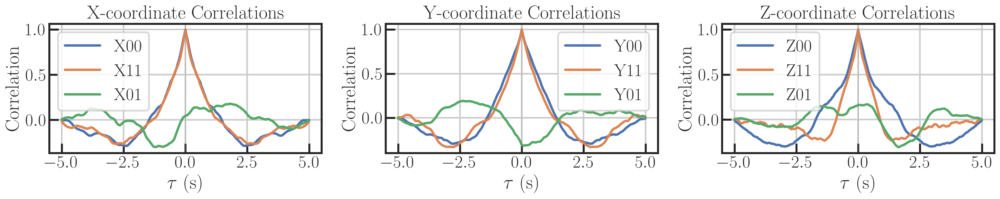

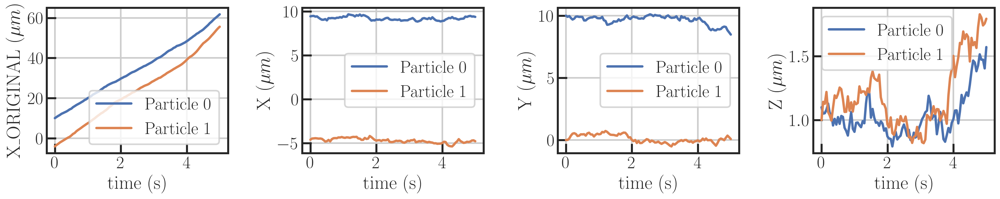

/var/folders/cn/hc6sy9vj2vlchg2np1k_bvvh0000gn/T/ipykernel_14236/3478093175.py:297: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(log_lags, log_msd01)


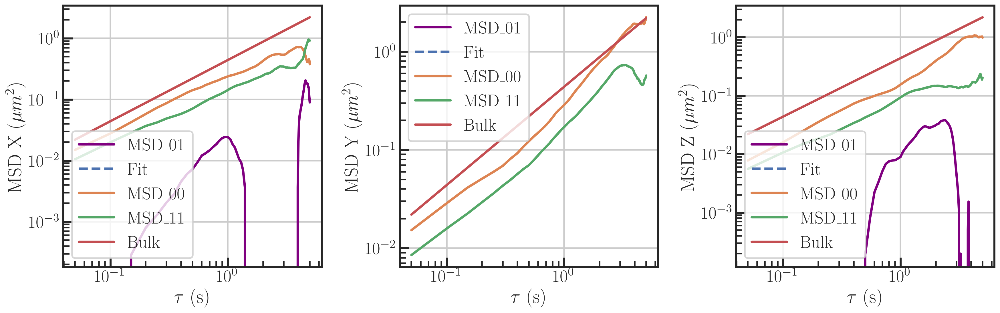

Extracted D coefficients from MSD_01 fit:
X: D = nan mum2/s (slope=nan)
Y: D = nan mum2/s (slope=nan)
Z: D = nan mum2/s (slope=nan)


{'x': nan, 'y': nan, 'z': nan}

In [3]:
# --- EXEC ---
df = pd.read_csv("test.csv")
df = correction_shear(df, shear_rate = 10., timestep_duration=5e-2) 

correlations = compute_lagged_correlations(df, normalize=True)


plot_lagged_correlations(correlations, timestep_duration=5e-2)
plot_trajectories(df, timestep_duration=5e-2, run_id = 1)
plot_msds(df, timestep_duration=5e-2) 


In [4]:
# Nice ! Now, do it for all files in a systematic function.


In [5]:
import re

def extract_pair_number(name) :
    match = re.search(r"\d{4}", name)
    if match:
        pair_number = match.group() #match.group(1).rstrip('-')
        try:
            return str(pair_number)
        except ValueError:
            print(f"Error.")
    return None

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0000_i0_j0_k0/all_runs.csv
0000
[-10.   0. 100.] [-12.3   0.  101. ] 2.5079872407968913


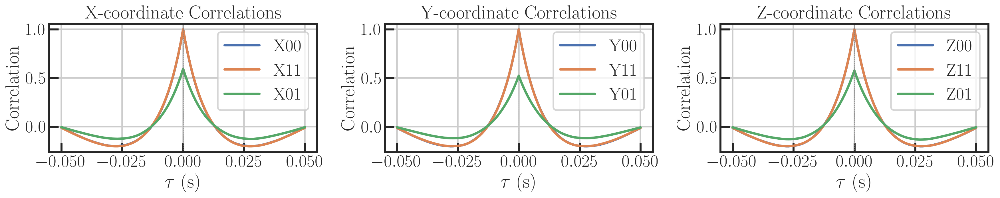

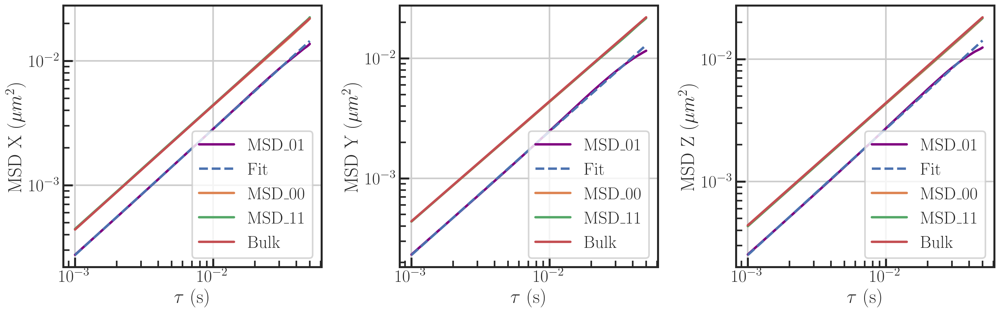

Extracted D coefficients from MSD_01 fit:
X: D = 1.5075e-01 mum2/s (slope=1.01)
Y: D = 1.4095e-01 mum2/s (slope=1.03)
Z: D = 1.5610e-01 mum2/s (slope=1.03)


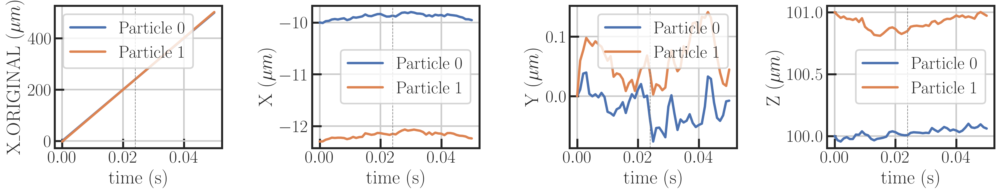

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0001_i0_j0_k1/all_runs.csv
0001
[-10.   0. 100.] [-12.31736842   0.         101.17368421] 2.5976395101958913


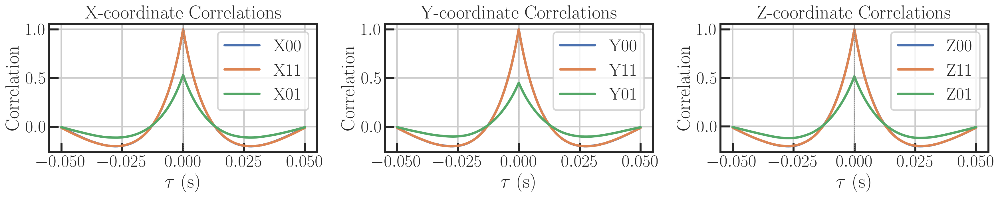

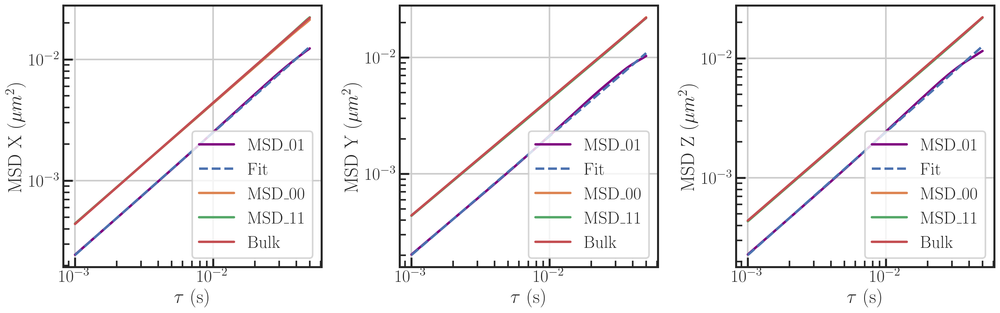

Extracted D coefficients from MSD_01 fit:
X: D = 1.3082e-01 mum2/s (slope=1.01)
Y: D = 1.1639e-01 mum2/s (slope=1.02)
Z: D = 1.3728e-01 mum2/s (slope=1.03)


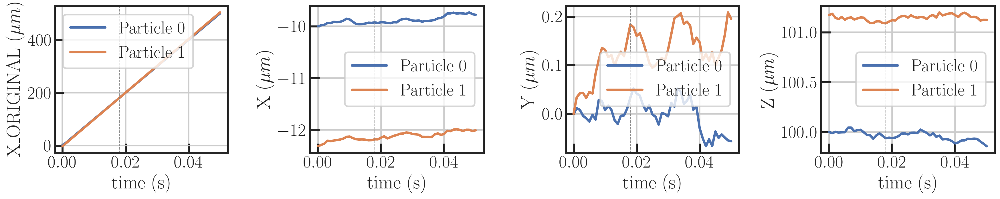

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0002_i0_j0_k2/all_runs.csv
0002
[-10.   0. 100.] [-12.33473684   0.         101.34736842] 2.6956256757816983


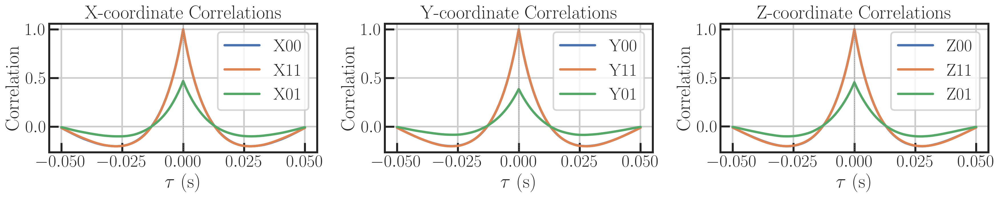

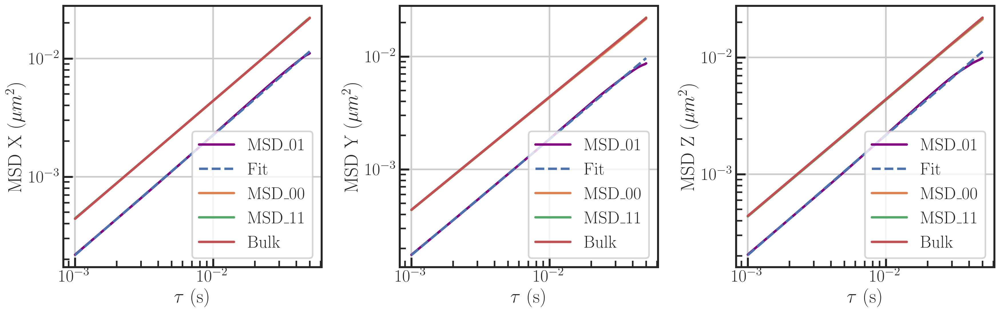

Extracted D coefficients from MSD_01 fit:
X: D = 1.2015e-01 mum2/s (slope=1.01)
Y: D = 1.0468e-01 mum2/s (slope=1.03)
Z: D = 1.2182e-01 mum2/s (slope=1.03)


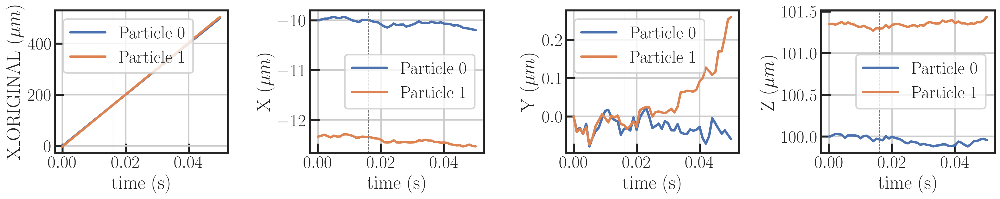

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0003_i0_j0_k3/all_runs.csv
0003
[-10.   0. 100.] [-12.35210526   0.         101.52105263] 2.8010712731039766


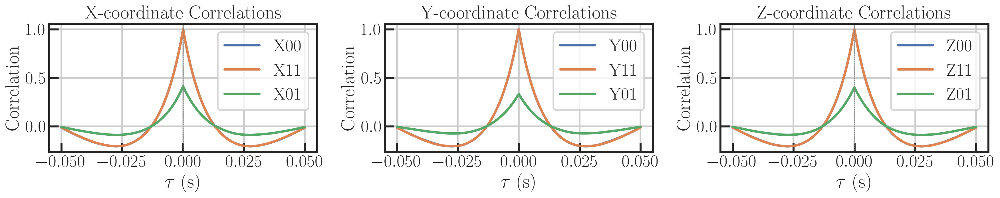

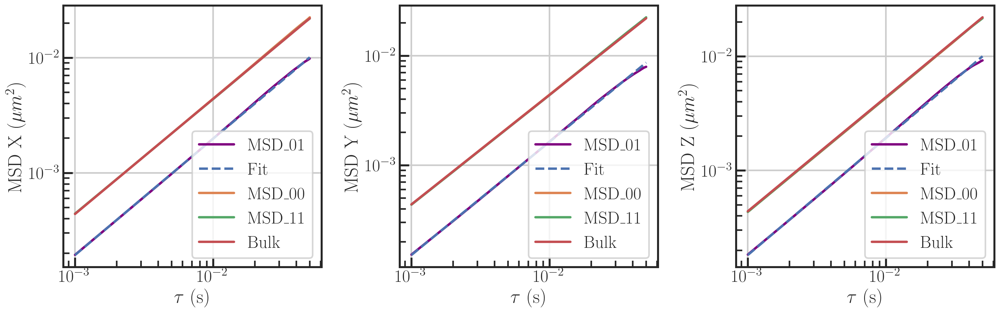

Extracted D coefficients from MSD_01 fit:
X: D = 1.0415e-01 mum2/s (slope=1.01)
Y: D = 9.5801e-02 mum2/s (slope=1.03)
Z: D = 1.0782e-01 mum2/s (slope=1.02)


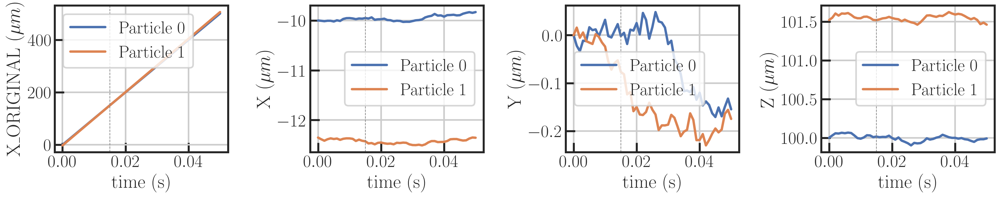

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0004_i0_j0_k4/all_runs.csv
0004
[-10.   0. 100.] [-12.36947368   0.         101.69473684] 2.9131664051603887


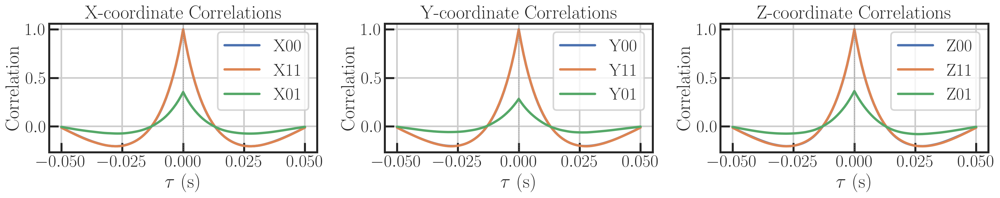

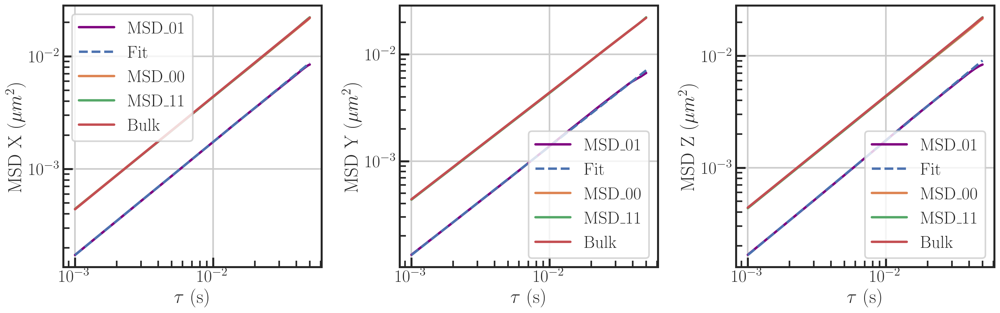

Extracted D coefficients from MSD_01 fit:
X: D = 8.8225e-02 mum2/s (slope=1.00)
Y: D = 7.4771e-02 mum2/s (slope=1.02)
Z: D = 9.7665e-02 mum2/s (slope=1.02)


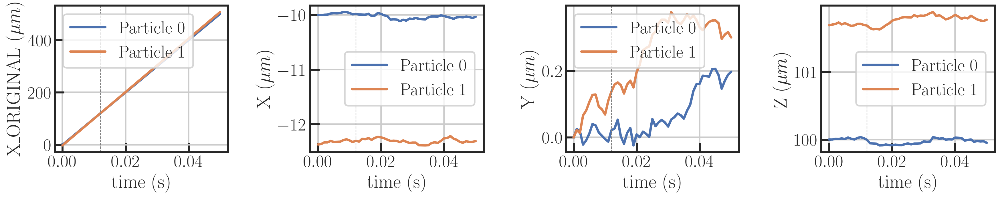

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0005_i0_j0_k5/all_runs.csv
0005
[-10.   0. 100.] [-12.38684211   0.         101.86842105] 3.0311734469300755


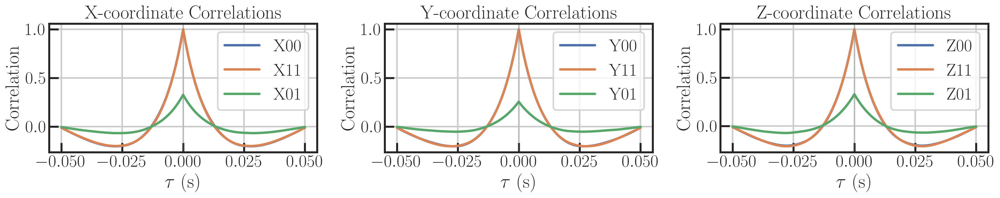

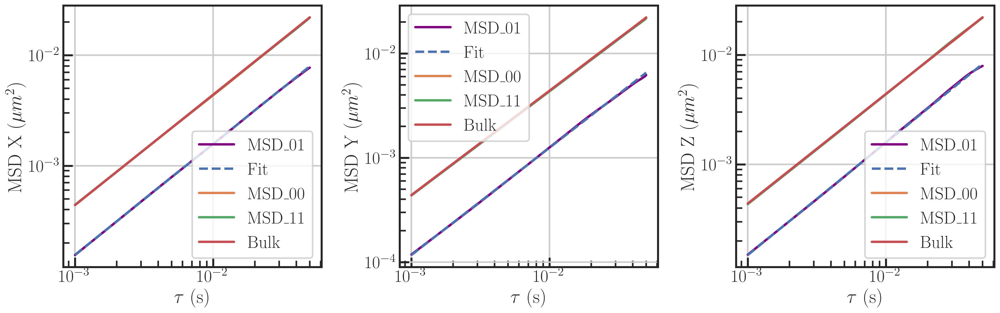

Extracted D coefficients from MSD_01 fit:
X: D = 8.0512e-02 mum2/s (slope=1.00)
Y: D = 7.1033e-02 mum2/s (slope=1.03)
Z: D = 8.9401e-02 mum2/s (slope=1.03)


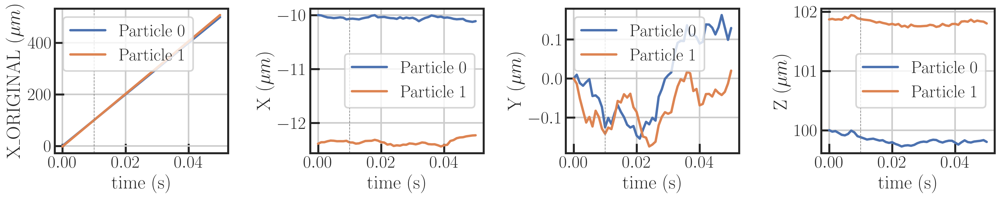

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0006_i0_j0_k6/all_runs.csv
0006
[-10.   0. 100.] [-12.40421053   0.         102.04210526] 3.154428975371742


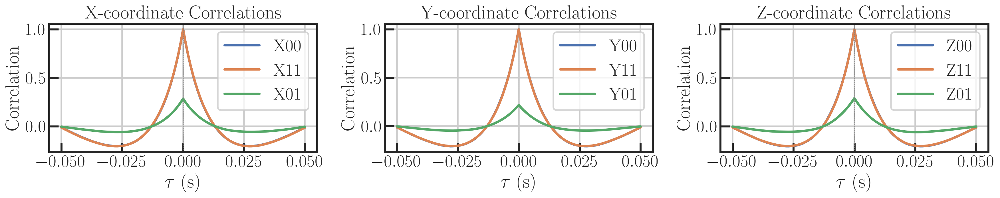

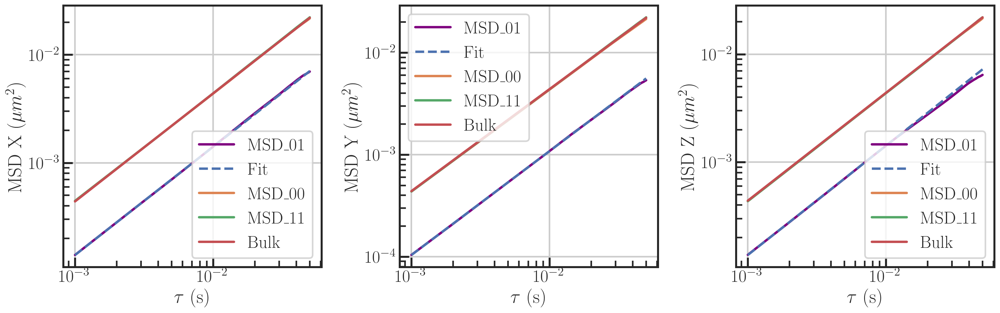

Extracted D coefficients from MSD_01 fit:
X: D = 7.0977e-02 mum2/s (slope=1.00)
Y: D = 5.9141e-02 mum2/s (slope=1.02)
Z: D = 7.5422e-02 mum2/s (slope=1.01)


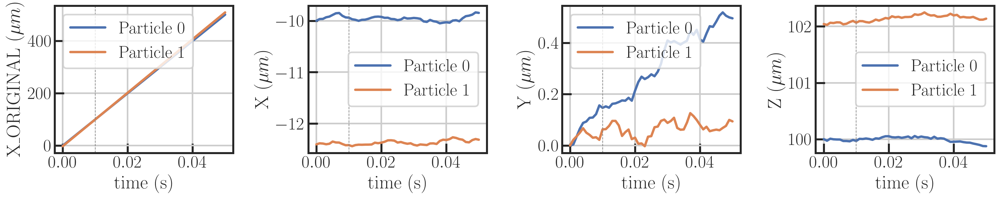

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0007_i0_j0_k7/all_runs.csv
0007
[-10.   0. 100.] [-12.42157895   0.         102.21578947] 3.2823417844623735


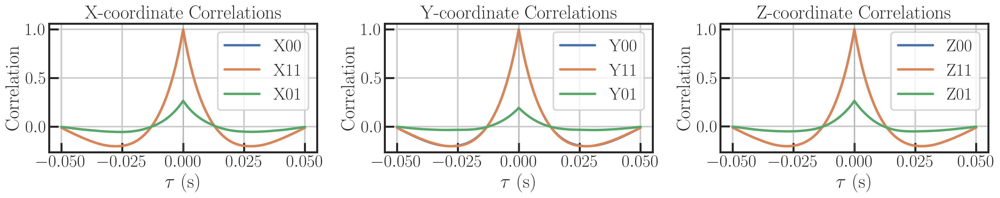

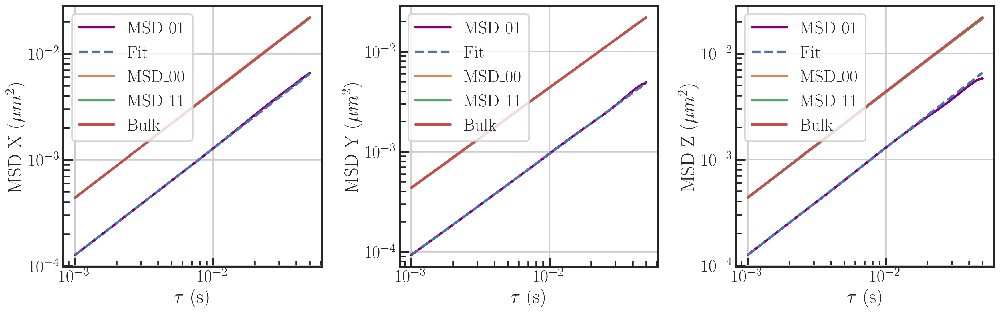

Extracted D coefficients from MSD_01 fit:
X: D = 6.5219e-02 mum2/s (slope=1.00)
Y: D = 5.0018e-02 mum2/s (slope=1.01)
Z: D = 6.8570e-02 mum2/s (slope=1.01)


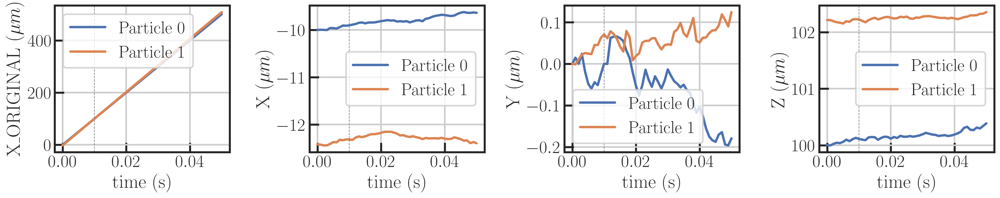

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0008_i0_j0_k8/all_runs.csv
0008
[-10.   0. 100.] [-12.43894737   0.         102.38947368] 3.414388488948283


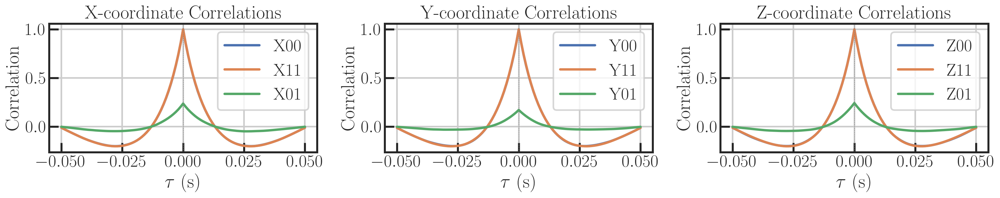

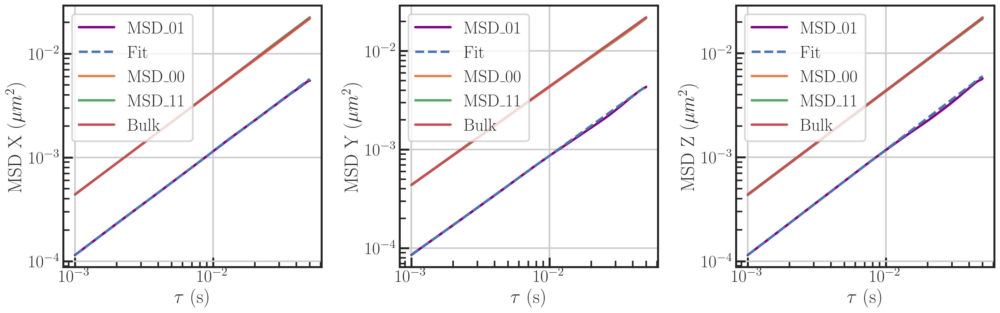

Extracted D coefficients from MSD_01 fit:
X: D = 5.6600e-02 mum2/s (slope=1.00)
Y: D = 4.5103e-02 mum2/s (slope=1.01)
Z: D = 6.2709e-02 mum2/s (slope=1.01)


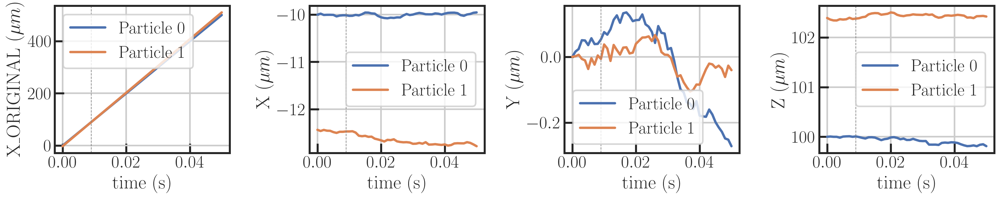

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0009_i0_j0_k9/all_runs.csv
0009
[-10.   0. 100.] [-12.45631579   0.         102.56315789] 3.5501078365268786


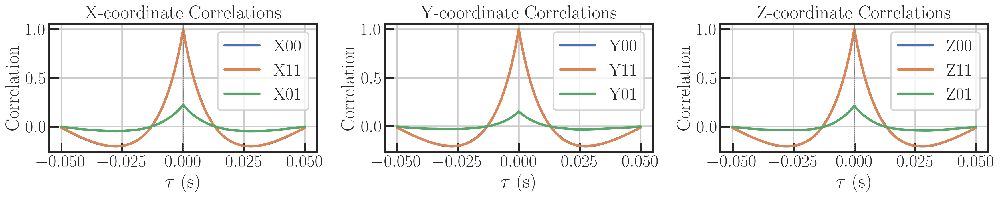

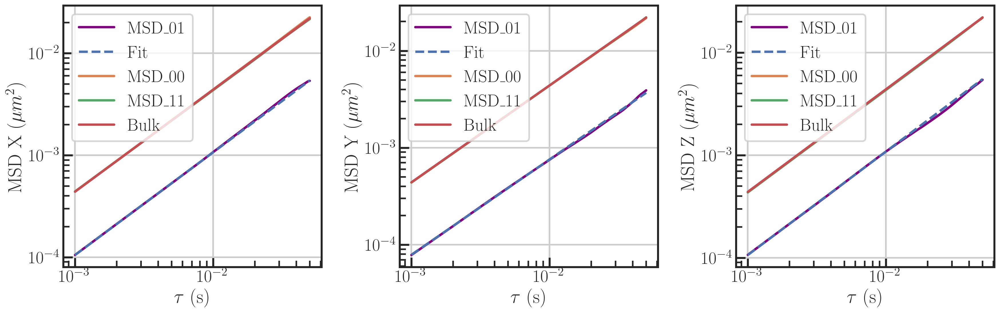

Extracted D coefficients from MSD_01 fit:
X: D = 5.5286e-02 mum2/s (slope=1.01)
Y: D = 3.5079e-02 mum2/s (slope=0.98)
Z: D = 5.6648e-02 mum2/s (slope=1.01)


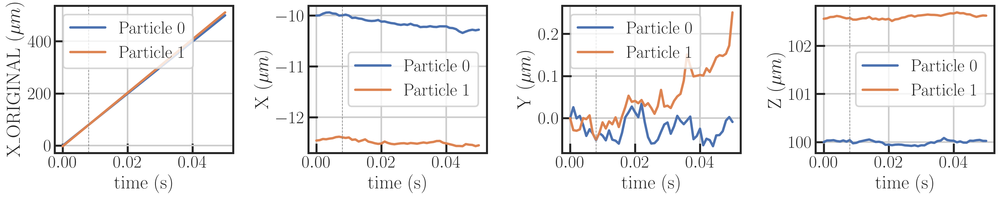

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0010_i0_j0_k10/all_runs.csv
0010
[-10.   0. 100.] [-12.47368421   0.         102.73684211] 3.689094507131598


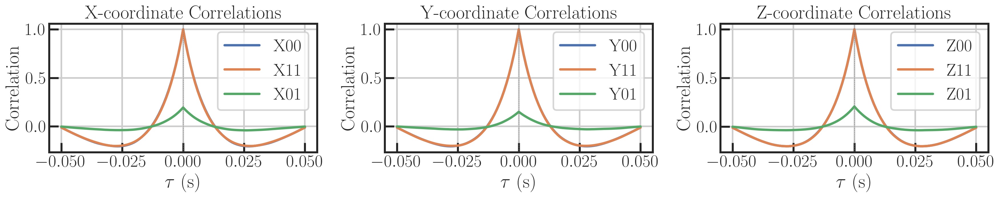

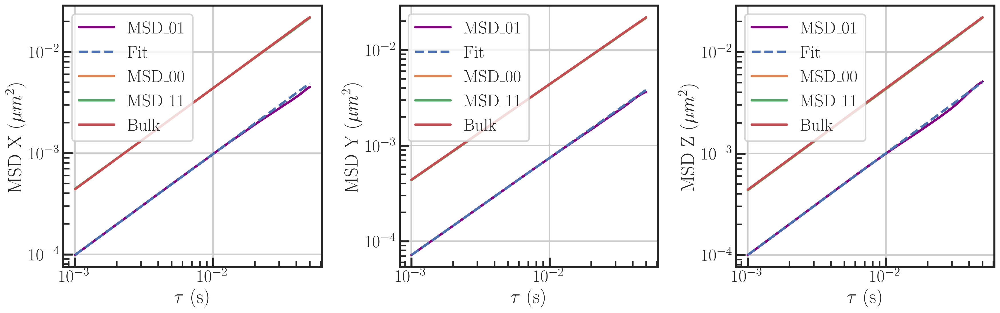

Extracted D coefficients from MSD_01 fit:
X: D = 4.8811e-02 mum2/s (slope=1.00)
Y: D = 4.0225e-02 mum2/s (slope=1.02)
Z: D = 5.0895e-02 mum2/s (slope=1.00)


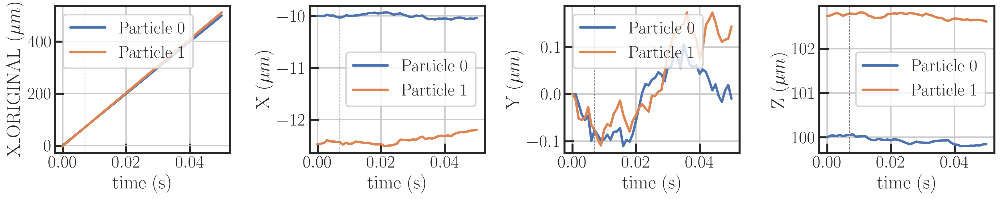

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0011_i0_j0_k11/all_runs.csv
0011
[-10.   0. 100.] [-12.49105263   0.         102.91052632] 3.830992906310257


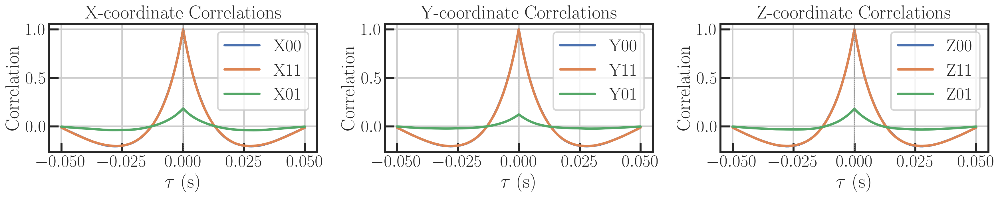

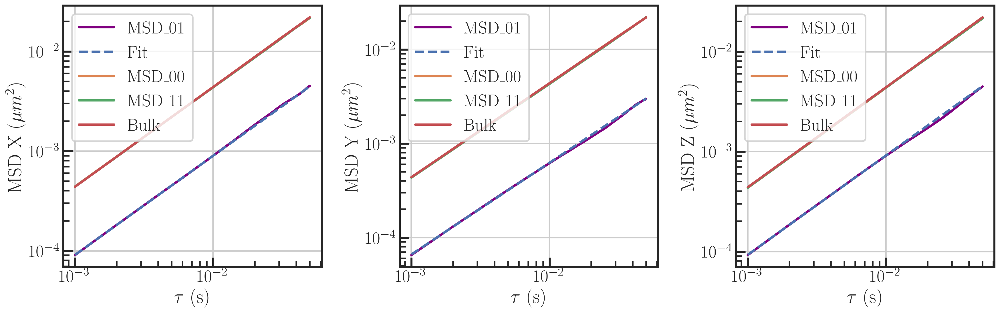

Extracted D coefficients from MSD_01 fit:
X: D = 4.3825e-02 mum2/s (slope=0.99)
Y: D = 2.8034e-02 mum2/s (slope=0.98)
Z: D = 4.4320e-02 mum2/s (slope=0.99)


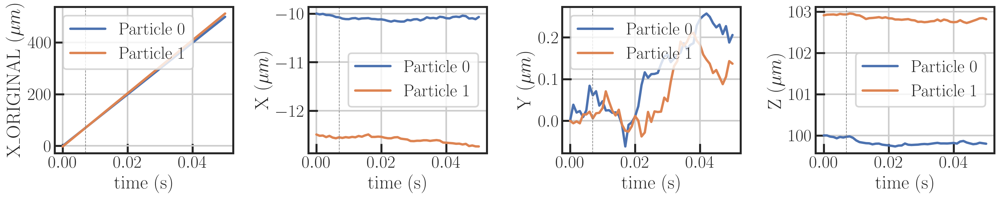

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0012_i0_j0_k12/all_runs.csv
0012
[-10.   0. 100.] [-12.50842105   0.         103.08421053] 3.97549125869024


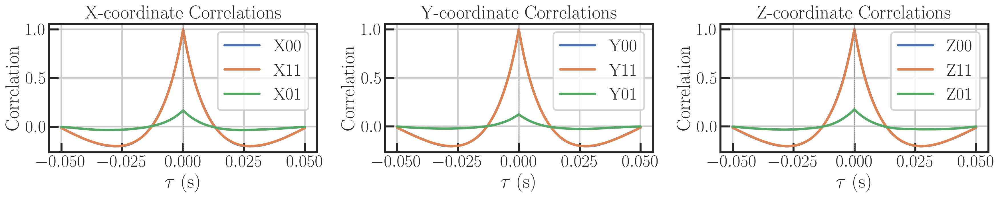

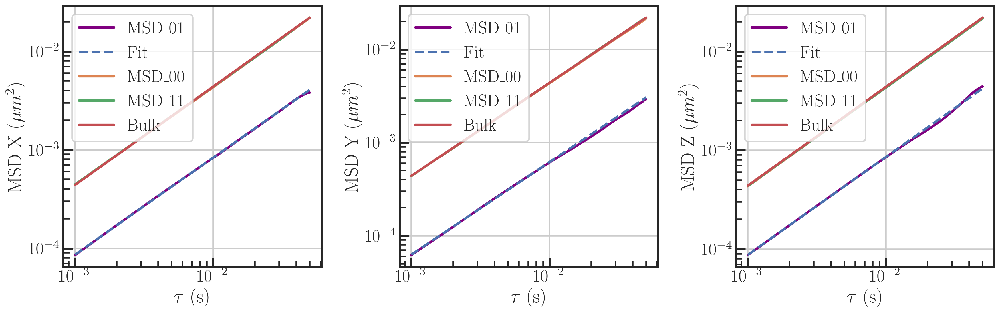

Extracted D coefficients from MSD_01 fit:
X: D = 3.9065e-02 mum2/s (slope=0.99)
Y: D = 3.0098e-02 mum2/s (slope=0.99)
Z: D = 4.1065e-02 mum2/s (slope=0.99)


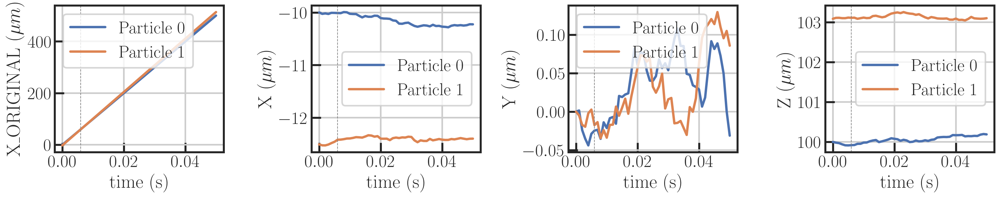

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0013_i0_j0_k13/all_runs.csv
0013
[-10.   0. 100.] [-12.52578947   0.         103.25789474] 4.1223161671222455


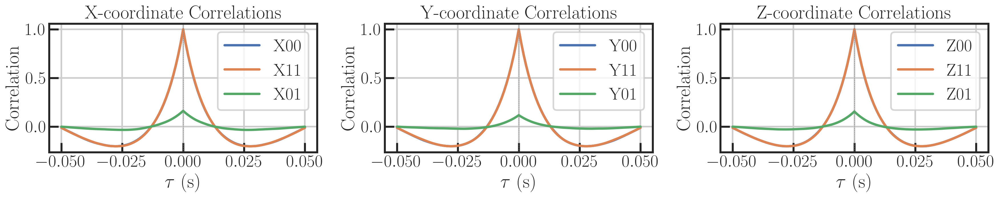

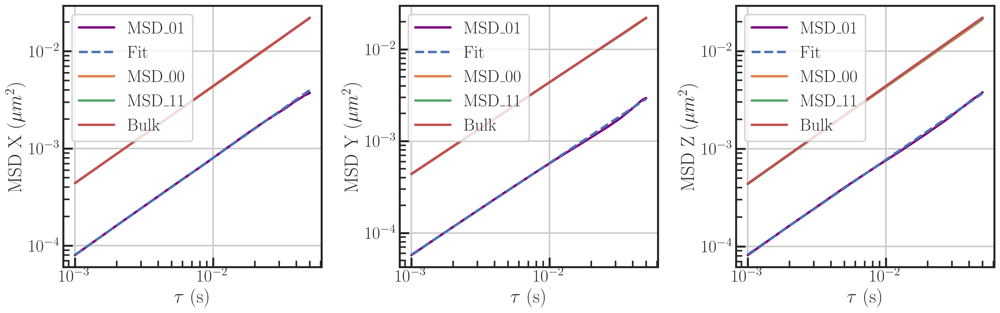

Extracted D coefficients from MSD_01 fit:
X: D = 3.9634e-02 mum2/s (slope=1.00)
Y: D = 2.8780e-02 mum2/s (slope=1.00)
Z: D = 3.3620e-02 mum2/s (slope=0.97)


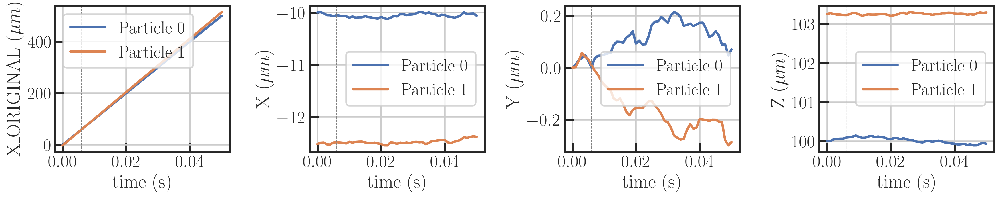

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0014_i0_j0_k14/all_runs.csv
0014
[-10.   0. 100.] [-12.54315789   0.         103.43157895] 4.271227709872713


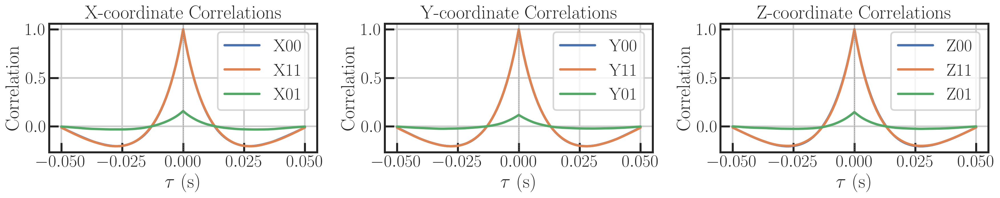

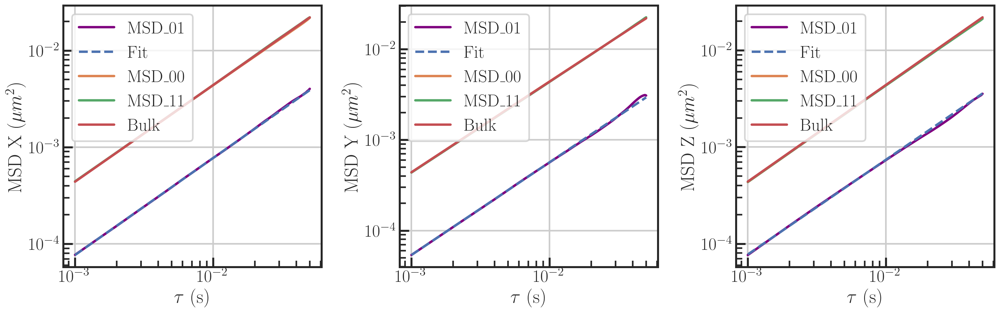

Extracted D coefficients from MSD_01 fit:
X: D = 3.9296e-02 mum2/s (slope=1.00)
Y: D = 3.1562e-02 mum2/s (slope=1.02)
Z: D = 3.3712e-02 mum2/s (slope=0.98)


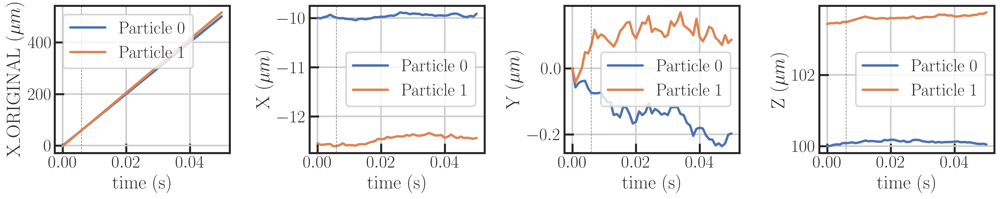

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0015_i0_j0_k15/all_runs.csv
0015
[-10.   0. 100.] [-12.56052632   0.         103.60526316] 4.422015089472623


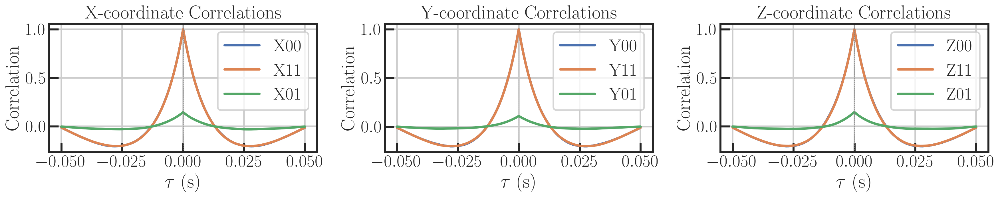

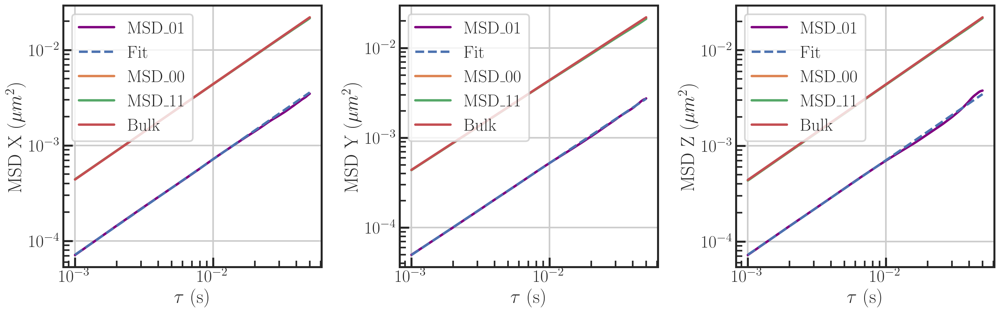

Extracted D coefficients from MSD_01 fit:
X: D = 3.5959e-02 mum2/s (slope=1.00)
Y: D = 2.9330e-02 mum2/s (slope=1.02)
Z: D = 3.3535e-02 mum2/s (slope=0.99)


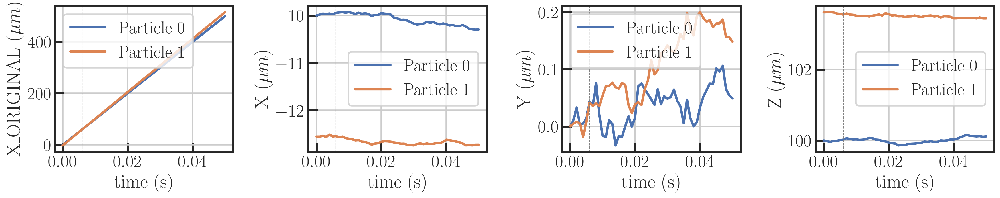

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0016_i0_j0_k16/all_runs.csv
0016
[-10.   0. 100.] [-12.57789474   0.         103.77894737] 4.574492812054092


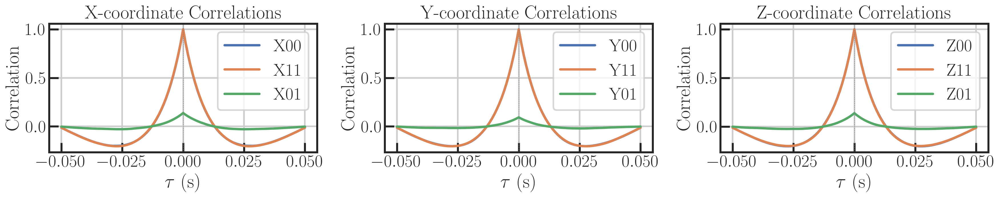

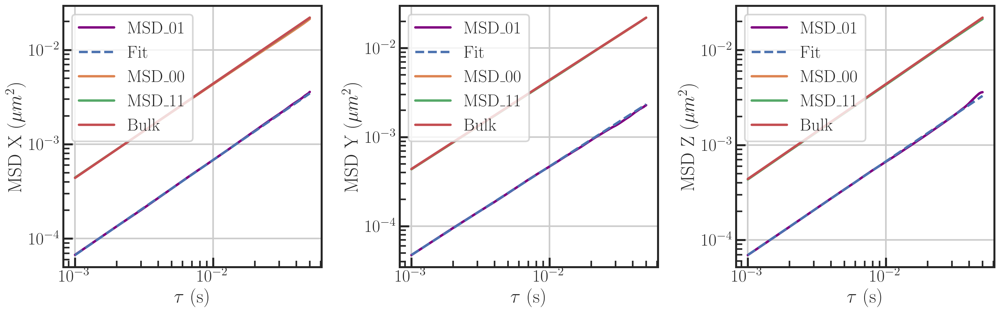

Extracted D coefficients from MSD_01 fit:
X: D = 3.5421e-02 mum2/s (slope=1.01)
Y: D = 2.3093e-02 mum2/s (slope=1.00)
Z: D = 3.1640e-02 mum2/s (slope=0.99)


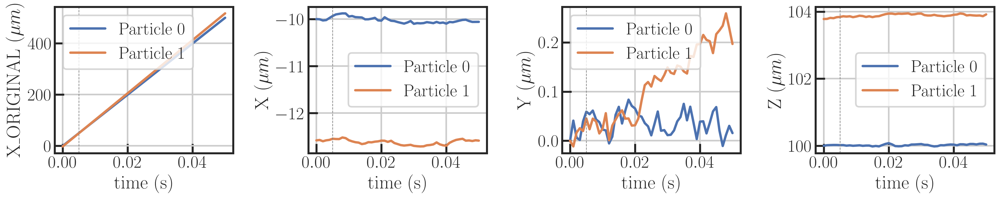

/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0017_i0_j0_k17/all_runs.csv


FileNotFoundError: [Errno 2] No such file or directory: '/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/pair_0017_i0_j0_k17/all_runs.csv'

In [ ]:
from pathlib import Path

results_root = Path("/Users/juls/RigidMultiblobsWall-1/multi_bodies/examples/passing_problem/pairs_output/")
csv_paths = sorted(results_root.glob("*/all_runs.csv"))
timestep_duration = 1e-3
shear_rate = 100


all_results = []

for csv_path in csv_paths:
    print(csv_path)
    if csv_path:
        df = pd.read_csv(csv_path) 
        df = correction_shear(df, shear_rate=shear_rate, timestep_duration=timestep_duration)
        pair_number = extract_pair_number(str(csv_path))
        starting_distance = compute_initial_distance(df)


        correlations = compute_lagged_correlations(df, normalize=True)
        plot_lagged_correlations(correlations, timestep_duration=timestep_duration)


        D_results = plot_msds(df, timestep_duration=timestep_duration)

        result_entry = {
            'pair_number': pair_number,
            'starting_distance': starting_distance,
            'D_x': D_results['x'],
            'D_y': D_results['y'],
            'D_z': D_results['z']
        }
        all_results.append(result_entry)

        # Plot 
        plot_trajectories(df, timestep_duration=timestep_duration, run_id=1)


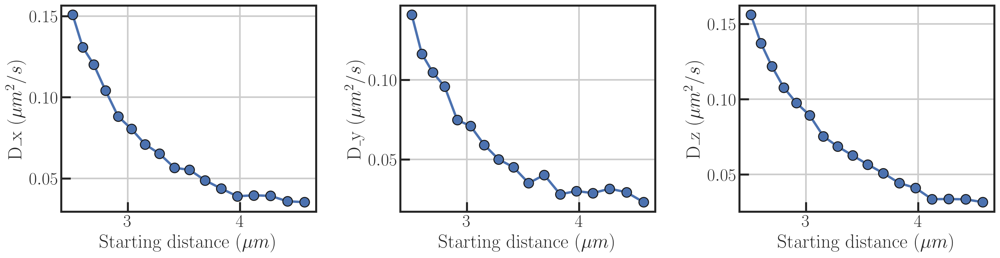

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

results_df = pd.DataFrame(all_results)

# sort
results_df.sort_values('starting_distance', inplace=True)

# Plot D_x, D_y, D_z vs starting distance
fig, axs = plt.subplots(1, 3, figsize=(18,5))

for i, axis in enumerate(['D_x', 'D_y', 'D_z']):
    ax = axs[i]
    ax.plot(results_df['starting_distance'], results_df[axis], 'o-')
    ax.set_xlabel('Starting distance ($\\mu m$)')
    ax.set_ylabel(f'{axis} ($\\mu m^2/s$)')
    ax.grid(True)

plt.tight_layout()
plt.savefig('three_directions_D.pdf', transparent = True)
plt.show()



<>:18: SyntaxWarning: invalid escape sequence '\m'
<>:19: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\p'
<>:34: SyntaxWarning: invalid escape sequence '\m'
<>:35: SyntaxWarning: invalid escape sequence '\p'
<>:18: SyntaxWarning: invalid escape sequence '\m'
<>:19: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\p'
<>:34: SyntaxWarning: invalid escape sequence '\m'
<>:35: SyntaxWarning: invalid escape sequence '\p'
/var/folders/cn/hc6sy9vj2vlchg2np1k_bvvh0000gn/T/ipykernel_14236/3734264980.py:18: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel('Starting Distance ($\\mu \mathrm{m}$) ')
/var/folders/cn/hc6sy9vj2vlchg2np1k_bvvh0000gn/T/ipykernel_14236/3734264980.py:19: SyntaxWarning: invalid escape sequence '\m'
  plt.ylabel('(D_x + D_y + D_z) ($\\mu \mathrm{m}^2$/s)')
/var/folders/cn/hc6sy

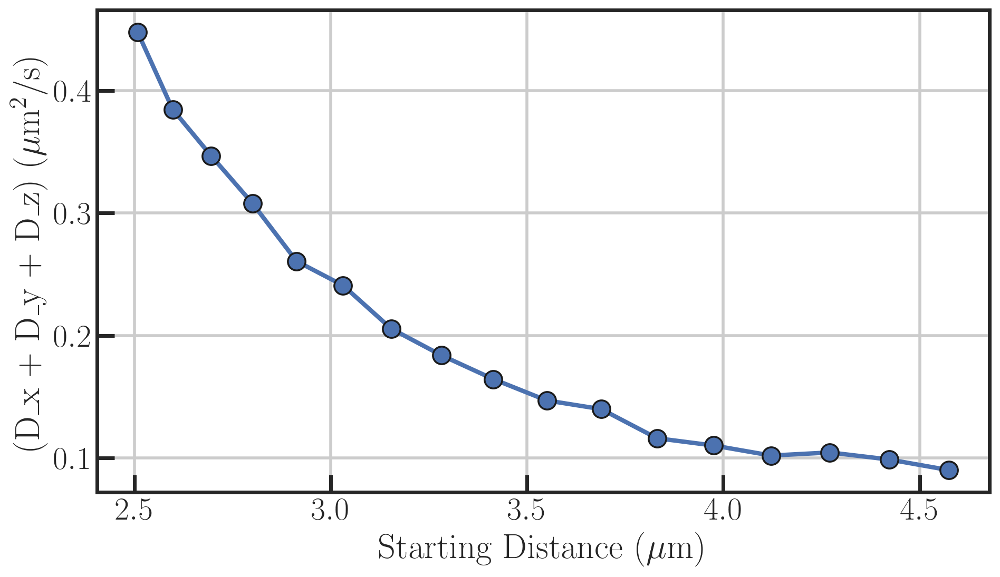

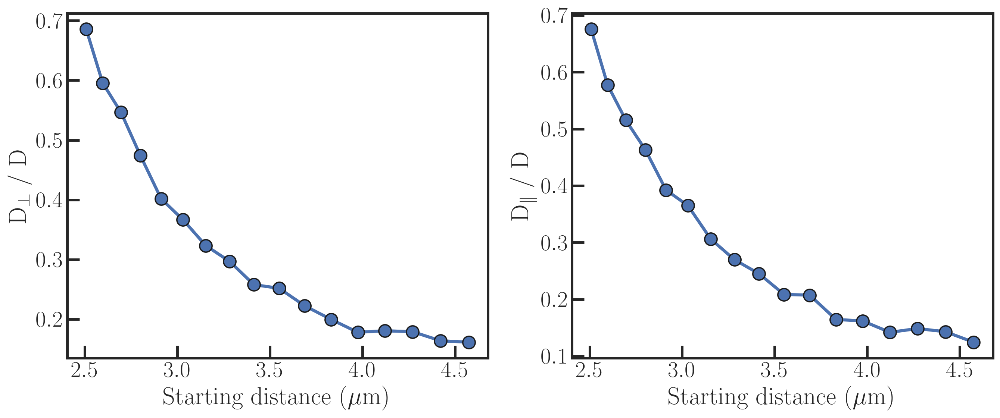

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming all_results is already defined as a list of dicts or similar
results_df = pd.DataFrame(all_results)

# Sort by starting distance
results_df.sort_values('starting_distance', inplace=True)

# Compute total D as sum of D_x, D_y, D_z
results_df['D_total'] = results_df[['D_x', 'D_y', 'D_z']].sum(axis=1)
results_df['D_perp'] = results_df['D_x']
results_df['D_par'] = results_df[['D_y', 'D_z']].mean(axis=1)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(results_df['starting_distance'], results_df['D_total'], marker='o')
plt.xlabel('Starting Distance ($\\mu \mathrm{m}$) ')
plt.ylabel('(D_x + D_y + D_z) ($\\mu \mathrm{m}^2$/s)')
plt.grid(True)
plt.tight_layout()
plt.savefig('total_D.pdf', transparent = True)
plt.show()




fig, axs = plt.subplots(1, 2, figsize = (16, 6))
axs[0].plot(results_df['starting_distance'], results_df['D_perp']/(0.0041419464 / (6 * np.pi * 1e-3 * 1.)), marker='o')
axs[0].set_xlabel('Starting distance ($\\mu \mathrm{m}$)')
axs[0].set_ylabel('D$_\perp$ / D')

axs[1].plot(results_df['starting_distance'], results_df['D_par']/(0.0041419464 / (6 * np.pi * 1e-3 * 1.)), marker='o')
axs[1].set_xlabel('Starting distance ($\\mu \mathrm{m}$)')
axs[1].set_ylabel('D$_\parallel$ / D')

plt.savefig('par_perp_D_renorm.pdf', transparent = True)
plt.show()

# Plotting the evolution of the cross-diffusion